# GenHack 4 - ChefAI - Urban Heat Island Effect Visualization

- **Group**: ChefAI
- **Period**: 2 - Visualize and Explain the Urban Heat Island Effect

## Introduction

In this notebook we will explore the Urban Heat Island (UHI) effect, which refers to the phenomenon where urban areas experience higher temperatures than their rural surroundings due to human activities and infrastructure.

We will visualize the UHI effect by analyzing temperature patterns in Emilia-Romagna, with a focus on the city of Bologna, all while considering other key factors like the NDVI index and the DEGURBA index.


## 0. Setup

### Imports and Dataset Loading Functions


In [1]:
import glob
import warnings
import math
import typing
import json

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import xarray as xr
import rioxarray as rioxr
import seaborn as sns

from scipy import stats
from tqdm import tqdm
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import Normalize

In [2]:
# ECA&D station functions
def dms_to_decimal(dms_series) -> pd.Series:
    """DMS (degrees, minutes, seconds) to decimal degrees conversion."""
    # Extract sign
    signs = np.where(dms_series.str[0] == "+", 1, -1)
    # Remove sign and split by ':'
    parts = dms_series.str[1:].str.split(":", expand=True).astype(float)
    # Calculate decimal degrees
    decimal = signs * (parts[0] + parts[1] / 60 + parts[2] / 3600)
    return decimal


def eca_read_stations(path: str) -> gpd.GeoDataFrame:
    """Load ECA&D stations from a CSV file and convert to GeoDataFrame."""

    stations_df = pd.read_csv(path, skiprows=17, skipinitialspace=True)

    # Strip whitespace from column names
    stations_df.columns = stations_df.columns.str.strip()

    # Strip whitespace from CN and STANAME columns
    stations_df["CN"] = stations_df["CN"].str.strip()
    stations_df["STANAME"] = stations_df["STANAME"].str.strip()

    # Convert degrees-minutes-seconds to decimal degrees
    lat_decimal = dms_to_decimal(stations_df["LAT"])
    lon_decimal = dms_to_decimal(stations_df["LON"])

    # Create GeoDataFrame
    geometries = gpd.points_from_xy(lon_decimal, lat_decimal)
    stations_gdf = gpd.GeoDataFrame(stations_df, geometry=geometries, crs="EPSG:4326")

    # Drop original LAT and LON columns
    stations_gdf.drop(columns=["LAT", "LON"], inplace=True)

    return stations_gdf


def eca_read_station_tx(path: str) -> pd.DataFrame:
    """Read TX data for a single ECA&D station."""

    station_df = pd.read_csv(path, skiprows=20, skipinitialspace=True, engine="c")

    # Convert DATE column to datetime
    station_df["DATE"] = pd.to_datetime(station_df["DATE"], format="%Y%m%d")
    # Convert from tenths of degree C to degree C
    station_df["TX"] = station_df["TX"] / 10.0
    # Where Q_TX is 9, set TX to NaN
    station_df = station_df[station_df["Q_TX"] == 0]
    station_df.drop(columns=["Q_TX"], inplace=True)

    return station_df


def eca_read_all_stations_tx(paths: list[str]) -> pd.DataFrame:
    """Read TX data for multiple ECA&D stations and concatenate into a single DataFrame."""
    all_stations_df = pd.DataFrame()

    for path in tqdm(paths, desc="Reading station TX data"):
        station_df = eca_read_station_tx(path)
        all_stations_df = pd.concat([all_stations_df, station_df], ignore_index=True)

    return all_stations_df


In [3]:
# ERA5 loader
def era5_read_xr(path_glob: str) -> xr.Dataset:
    """Load ERA5 dataset from one or more NetCDF files."""
    paths = list(glob.glob(path_glob))

    dataset = xr.open_mfdataset(paths, combine="by_coords")
    dataset.rio.write_crs("EPSG:4326", inplace=True)

    return dataset

In [4]:
# NDVI functions
def ndvi_read_xr(path: str) -> xr.DataArray:
    """Load NDVI raster lazily and rescale from 0–255 to -1..1."""
    # lazy read
    ndvi = rioxr.open_rasterio(path, masked=True, chunks=True, lock=False)
    ndvi = typing.cast(xr.DataArray, ndvi)
    ndvi = ndvi.squeeze()

    # mask nodata (255)
    ndvi = ndvi.where(ndvi != 255)

    # lazy scaling (dask)
    ndvi = ndvi * (2 / 255) - 1

    return ndvi


def ndvi_read_xr_bbox_clip(path: str, gdf: gpd.GeoDataFrame) -> xr.DataArray:
    """
    Load NDVI lazily and clip to the bbox of the GeoDataFrame.
    CRS is handled correctly by reprojecting the region to raster CRS.
    """
    # Load NDVI
    ndvi = ndvi_read_xr(path)
    # Convert gdf to raster CRS
    gdf_r = gdf.to_crs(ndvi.rio.crs)
    minx, miny, maxx, maxy = gdf_r.total_bounds
    # Clip to bbox
    ndvi_filtered = ndvi.rio.clip_box(minx=minx, miny=miny, maxx=maxx, maxy=maxy)
    return ndvi_filtered


In [5]:
# Custom colormap for NDVI visualization
ndvi_cmap = LinearSegmentedColormap.from_list("ndvi_cmap", ["blue", "white", "green"])

### Dataset Loading

In [6]:
# GADM GeoDataFrame
gadm_gdf = gpd.read_file("../data/gadm_410_europe.gpkg")

In [7]:
# ERA 5 daily max temperature at 2m
era5_variable_of_interest = "temperature"
era5_xr = era5_read_xr(f"../data/derived-era5-land-daily-statistics/*_{era5_variable_of_interest}*.nc")

In [8]:
# ECA&D stations
stations_path = "../processed/ECA_blend_tx/stations.txt"
stations_gdf = eca_read_stations(stations_path)

## 1. Urban Heat Island Analysis - Bologna

We aim to investigate how the Urban Heat Island (UHI) effect manifests within our selected region of interest.

To begin, we will define the study area and load the corresponding datasets:


In [9]:
import rasterio.enums

# GADM
region_str = "Bologna"
gadm_region = gadm_gdf[gadm_gdf["NAME_1"] == "Emilia-Romagna"].dissolve()
gadm_bigger_region = gadm_gdf[gadm_gdf["NAME_0"] == "Italy"].dissolve()
gadm_region_level1 = gadm_region.dissolve("GID_1")
gadm_region_flat = gadm_region_level1.dissolve()
print(f"GADM region shape: {gadm_region_flat.shape}, CRS: {gadm_region_flat.crs}")

# NDVI
ndvi_region_str = "2023-06-01_2023-09-01"
ndvi_region = (
    ndvi_read_xr(f"../data/sentinel2_ndvi/ndvi_{ndvi_region_str}.tif")
    .rio.clip_box(*gadm_region_flat.total_bounds, crs=gadm_region_flat.crs)
    .rio.clip(gadm_region_flat.geometry.values, crs=gadm_region_flat.crs, all_touched=True)
)
print(f"NDVI region shape: {ndvi_region.shape}, CRS: {ndvi_region.rio.crs}")

# ERA5
era5_day = "2023-08-10"
era5_region = era5_xr.rio.clip(gadm_bigger_region.geometry, gadm_bigger_region.crs, drop=True, all_touched=True)
era5_region = era5_region.sel(valid_time=era5_day)
era5_region_t2m = era5_region["t2m"]
era5_region_t2m = era5_region_t2m - 273.15  # Kelvin to Celsius
era5_region_t2m = era5_region_t2m.rio.reproject_match(ndvi_region, resampling=rasterio.enums.Resampling.bilinear)
print("ERA5 region shape:", era5_region_t2m.shape, "CRS:", era5_region_t2m.rio.crs)

GADM region shape: (1, 20), CRS: EPSG:4326
NDVI region shape: (1910, 3568), CRS: EPSG:3035
ERA5 region shape: (1910, 3568) CRS: EPSG:3035


### DEGURBA Classification

To help us build a metric that captures the UHI effect, we’ll bring in another dataset that describes the **degree of urbanization** across our region.

The DEGURBA classification groups areas into three categories:

- **Cities** – densely populated
- **Towns and suburbs** – medium-density areas
- **Rural areas** – sparsely populated

Now let’s load the DEGURBA dataset and merge it with the GADM regions:


In [10]:
# Load DEGURBA dataset for Emilia-Romagna
def read_degurba(path: str) -> pd.DataFrame:
    """Load DEGURBA data from a JSON file into a DataFrame."""
    with open(path, "r") as f:
        degurba_data = json.load(f)

    degurba_df = pd.DataFrame(degurba_data["resultset"])
    return degurba_df

degurba_df = read_degurba("../data/degurba-emilia.json")
degurba_df.head()

,COD_RIP,COD_REG,COD_UTS,COD_PROV_STORICO,PRO_COM_T,PRO_COM,COMUNE,COMUNE_A,SIGLA_AUTOMOBILISTICA,COM_ISO,...,DEGURBA_2011,DEGURBA_2021,COD_ECO_DIV_2018,DEN_ECO_DIV_2018,COD_ECO_PRO_2018,DEN_ECO_PRO_2018,COD_ECO_SEZ_2018,DEN_ECO_SEZ_2018,COD_ECO_SSEZ_2018,DEN_ECO_SSEZ_2018
0,2,08,033,033,033001,33001,Agazzano,None,PC,0,...,3,3,1,Divisione Temperata,1C,Provincia Appenninica,1C1,Sezione Appenninica Settentrionale e Nord-Occi...,1C1a,Sottosezione Appennino Tosco-Emiliano
1,2,08,033,033,033002,33002,Alseno,None,PC,0,...,3,3,1,Divisione Temperata,1B,Provincia Padana,1B1,Sezione Padana,1B1b,Sottosezione Pianura Centrale
2,2,08,033,033,033003,33003,Besenzone,None,PC,0,...,3,3,1,Divisione Temperata,1B,Provincia Padana,1B1,Sezione Padana,1B1b,Sottosezione Pianura Centrale
3,2,08,033,033,033004,33004,Bettola,None,PC,0,...,3,3,1,Divisione Temperata,1C,Provincia Appenninica,1C1,Sezione Appenninica Settentrionale e Nord-Occi...,1C1a,Sottosezione Appennino Tosco-Emiliano
4,2,08,033,033,033005,33005,Bobbio,None,PC,0,...,3,3,1,Divisione Temperata,1C,Provincia Appenninica,1C1,Sezione Appenninica Settentrionale e Nord-Occi...,1C1a,Sottosezione Appennino Tosco-Emiliano


In [11]:
# Extract COMUNE names from urban areas (DEGURBA 1)
urban_areas = degurba_df[degurba_df["DEGURBA_2021"] == 1]["COMUNE"].str.lower().str.replace(" ", "")
print(f"{"Number of urban areas (DEGURBA 1):":<45} {len(urban_areas):3d}")

# Extract COMUNE names from rural areas (DEGURBA 2 and 3)
rural_areas = degurba_df[degurba_df["DEGURBA_2021"].isin([2, 3])]["COMUNE"].str.lower().str.replace(" ", "")
print(f"{"Number of rural areas (DEGURBA 2 and 3):":<45} {len(rural_areas):3d}")

Number of urban areas (DEGURBA 1):             11
Number of rural areas (DEGURBA 2 and 3):      319


In [12]:
# filter GADM municipalities for urban/rural
urban_gadm_gdf = gadm_gdf[gadm_gdf["NAME_3"].str.lower().str.replace(" ", "").isin(urban_areas)]
rural_gadm_gdf = gadm_gdf[gadm_gdf["NAME_3"].str.lower().str.replace(" ", "").isin(rural_areas)]

# Append all unclassified comuni to rural
all_emilia_comuni = gadm_gdf[gadm_gdf["NAME_1"] == "Emilia-Romagna"]
classified = set(urban_areas) | set(rural_areas)

# Find unclassified comuni
unclassified = all_emilia_comuni[~all_emilia_comuni["NAME_3"].str.lower().str.replace(" ", "").isin(classified)]
print(f"Number of unclassified entries: {len(unclassified)}")
print(f"Unclassified comuni: {unclassified['NAME_3'].tolist()}")

# Append to rural
rural_gadm_gdf = pd.concat([rural_gadm_gdf, unclassified], ignore_index=True)
print(f"Urban GADM shape: {urban_gadm_gdf.shape}")
print(f"Rural GADM shape: {rural_gadm_gdf.shape}")

Number of unclassified entries: 34
Unclassified comuni: ['Bazzano', 'Castello Di Serravalle', 'Crespellano', 'Granaglione', 'Monteveglio', 'Porretta Terme', 'Savigno', 'Berra', 'Formignana', 'Massa Fiscaglia', 'Migliarino', 'Migliaro', 'Mirabello', 'Ro', "Sant' Agostino", 'Tresigallo', 'Castrocaro Terme E Terra Del Sol', 'Mezzani', 'Polesine Parmense', 'Sissa', 'Sorbolo', 'Trecasali', 'Zibello', 'Caminata', 'Nibbiano', 'Pecorara', 'Busana', 'Collagna', 'Ligonchio', 'Ramiseto', 'Monte Colombo', 'Montescudo', 'Poggio Berni', 'Torriana']
Urban GADM shape: (11, 21)
Rural GADM shape: (339, 21)


### DEGURBA Visualization over GADM, ERA5-Land, and NDVI

We can now visualize the spatial distribution of GADM administrative divisions, ERA5-Land 2-meter temperatures, and NDVI values for our region of interest, overlaid with their respective urbanization classifications:

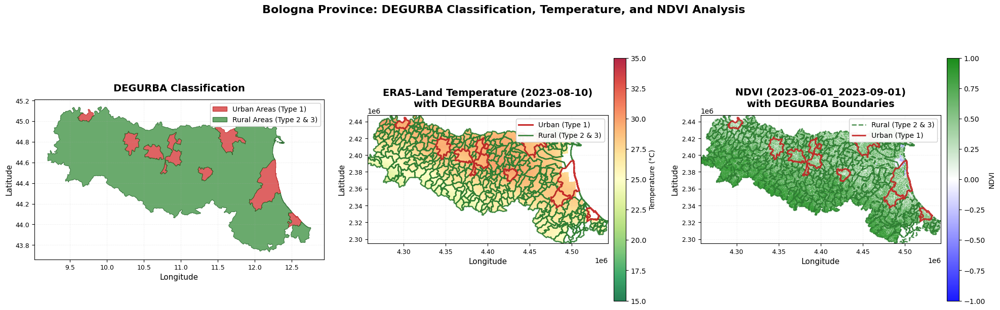

In [13]:
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Create figure with optimized layout
fig, axes = plt.subplots(1, 3, figsize=(20, 6.5))

# ============================================================================
# DATA PREPARATION
# ============================================================================

# Clip temperature to region boundaries
era5_temp_clipped = era5_region_t2m.rio.clip(
    gadm_region_flat.geometry.values, gadm_region_flat.crs, drop=True, all_touched=True
)

# Precompute CRS transformations
temp_crs = era5_temp_clipped.rio.crs
ndvi_crs = ndvi_region.rio.crs

urban_temp_crs = urban_gadm_gdf.to_crs(temp_crs)
rural_temp_crs = rural_gadm_gdf.to_crs(temp_crs)
urban_ndvi_crs = urban_gadm_gdf.to_crs(ndvi_crs)
rural_ndvi_crs = rural_gadm_gdf.to_crs(ndvi_crs)

# ============================================================================
# PANEL 1: DEGURBA CLASSIFICATION
# ============================================================================

urban_gadm_gdf.dissolve(by="ENGTYPE_1", method="coverage").plot(
    ax=axes[0], color="#D32F2F", alpha=0.75, edgecolor="#B71C1C", linewidth=0.8
)
rural_gadm_gdf.dissolve(by="ENGTYPE_1", method="coverage").plot(
    ax=axes[0], color="#388E3C", alpha=0.75, edgecolor="#1B5E20", linewidth=0.8
)

# Legend
urban_patch = mpatches.Patch(label="Urban Areas (Type 1)", facecolor="#D32F2F", edgecolor="#B71C1C", alpha=0.75)
rural_patch = mpatches.Patch(label="Rural Areas (Type 2 & 3)", facecolor="#388E3C", edgecolor="#1B5E20", alpha=0.75)
axes[0].legend(handles=[urban_patch, rural_patch], loc="upper right", framealpha=0.95, fontsize=10)

axes[0].set_title("DEGURBA Classification", fontsize=14, fontweight="bold", pad=12)
axes[0].set_xlabel("Longitude", fontsize=11)
axes[0].set_ylabel("Latitude", fontsize=11)
axes[0].grid(True, alpha=0.25, linestyle="--", linewidth=0.5)
axes[0].tick_params(labelsize=9)

# ============================================================================
# PANEL 2: TEMPERATURE WITH DEGURBA BOUNDARIES
# ============================================================================

era5_temp_clipped.plot(
    ax=axes[1],
    cmap="RdYlGn_r",
    vmin=15,
    vmax=35,
    alpha=0.85,
    add_colorbar=True,
    cbar_kwargs={"label": "Temperature (°C)", "shrink": 0.85, "pad": 0.02},
)

# Overlay boundaries
rural_temp_crs.boundary.plot(ax=axes[1], edgecolor="#2E7D32", linewidth=1.8, alpha=0.9)
urban_temp_crs.boundary.plot(ax=axes[1], edgecolor="#C62828", linewidth=2.2, alpha=0.95)


legend_elements = [
    Line2D([0], [0], color="#C62828", linewidth=2.2, label="Urban (Type 1)"),
    Line2D([0], [0], color="#2E7D32", linewidth=1.8, label="Rural (Type 2 & 3)"),
]

axes[1].set_title(
    f"ERA5-Land Temperature ({era5_day})\nwith DEGURBA Boundaries", fontsize=14, fontweight="bold", pad=12
)
axes[1].set_xlabel("Longitude", fontsize=11)
axes[1].set_ylabel("Latitude", fontsize=11)
axes[1].legend(handles=legend_elements, loc="upper right", framealpha=0.95, fontsize=10)
axes[1].grid(True, alpha=0.25, linestyle="--", linewidth=0.5)
axes[1].tick_params(labelsize=9)

# ============================================================================
# PANEL 3: NDVI WITH DEGURBA BOUNDARIES
# ============================================================================

ndvi_region.plot(
    ax=axes[2],
    cmap=ndvi_cmap,
    vmin=-1,
    vmax=1,
    alpha=0.9,
    add_colorbar=True,
    cbar_kwargs={"label": "NDVI", "shrink": 0.85, "pad": 0.02},
)

# Overlay boundaries
rural_ndvi_crs.boundary.plot(
    ax=axes[2], edgecolor="#2E7D32", linewidth=1.8, alpha=0.85, linestyle="--", label="Rural (Type 2 & 3)"
)
urban_ndvi_crs.boundary.plot(ax=axes[2], edgecolor="#C62828", linewidth=2.2, alpha=0.9, label="Urban (Type 1)")

axes[2].set_title(f"NDVI ({ndvi_region_str})\nwith DEGURBA Boundaries", fontsize=14, fontweight="bold", pad=12)
axes[2].set_xlabel("Longitude", fontsize=11)
axes[2].set_ylabel("Latitude", fontsize=11)
axes[2].legend(loc="upper right", framealpha=0.95, fontsize=10)
axes[2].grid(True, alpha=0.25, linestyle="--", linewidth=0.5)
axes[2].tick_params(labelsize=9)

# ============================================================================
# FINAL LAYOUT
# ============================================================================

fig.suptitle(
    "Bologna Province: DEGURBA Classification, Temperature, and NDVI Analysis", fontsize=16, fontweight="bold", y=0.99
)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

### UHI Metric Calculation

The standard way to measure the UHI effect is to compare the average temperature in urban areas with the average temperature in rural areas. The difference between these two values gives us the UHI metric.

To calculate this metric at the pixel level, we first need the average temperature of rural areas. We will create a mask for the ERA5-Land temperature data based on the rural zones identified in the DEGURBA classification, and then compute the mean temperature for those rural pixels.

In this section we will work only with ERA5-Land data to keep things straightforward. The same procedure can also be applied to the interpolated ECA data, which we will use in the next part of the analysis.


In [14]:
# Clip ERA5 temperature to urban areas only
region_era5_urban = era5_region_t2m.rio.clip(urban_gadm_gdf.to_crs(era5_region_t2m.rio.crs).geometry, drop=False)

In [15]:
def urban_mask(ndvi, gadm, threshold: float, urban=True):
    ndvi_clipped = ndvi.rio.clip(gadm.geometry.values, gadm.crs, drop=True)

    if urban:
        mask = ndvi_clipped < threshold
    else:
        mask = ndvi_clipped >= threshold

    return ndvi_clipped.where(mask)

In [16]:
# Clip ERA5 to rural areas using NDVI thresholding
ndvi_threshold = 0.5
ndvi_rural_mask = urban_mask(ndvi_region, rural_gadm_gdf, threshold=ndvi_threshold, urban=False)

# Reproject NDVI mask to match ERA5 grid
ndvi_rural_mask_reprojected = ndvi_rural_mask.rio.reproject_match(era5_region_t2m)

# Clip ERA5 to rural areas
region_era5_rural = era5_region_t2m.rio.clip(rural_gadm_gdf.geometry.values, rural_gadm_gdf.crs, drop=False)

# Further filter by NDVI threshold: keep only where NDVI >= threshold
# Use .values to avoid coordinate broadcasting issues
region_era5_rural = region_era5_rural.where(~np.isnan(ndvi_rural_mask_reprojected.values))

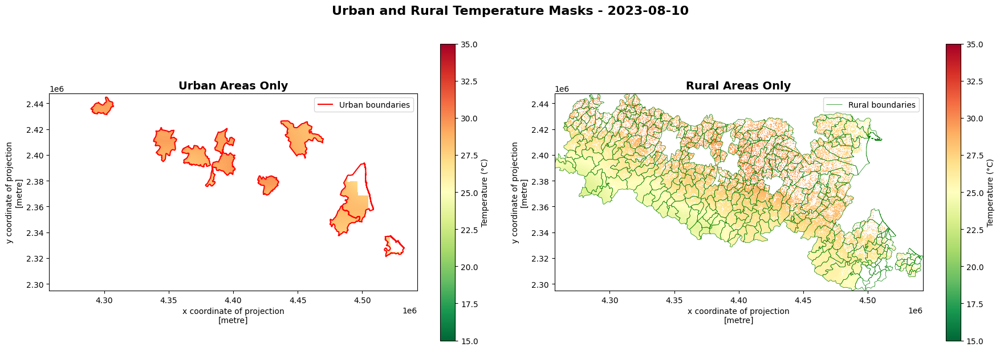

In [17]:
# =============================================================================
# Visualize Urban and Rural Temperature Masks
# =============================================================================
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Plot 1: Urban areas only
region_era5_urban.plot(ax=axes[0], cmap="RdYlGn_r", vmin=15, vmax=35, cbar_kwargs={"label": "Temperature (°C)"})
urban_gadm_gdf.to_crs(era5_region_t2m.rio.crs).boundary.plot(
    ax=axes[0], edgecolor="red", linewidth=1.5, label="Urban boundaries"
)
axes[0].set_title("Urban Areas Only", fontsize=14, fontweight="bold")
axes[0].set_aspect("equal")
axes[0].legend(loc="upper right")

# Plot 2: Rural areas only
region_era5_rural.plot(ax=axes[1], cmap="RdYlGn_r", vmin=15, vmax=35, cbar_kwargs={"label": "Temperature (°C)"})
rural_gadm_gdf.to_crs(era5_region_t2m.rio.crs).boundary.plot(
    ax=axes[1], edgecolor="green", linewidth=0.5, label="Rural boundaries"
)
axes[1].set_title("Rural Areas Only", fontsize=14, fontweight="bold")
axes[1].set_aspect("equal")
axes[1].legend(loc="upper right")

plt.suptitle(f"Urban and Rural Temperature Masks - {era5_day}", fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

In [18]:
# Calculate rural mean temperatures for UHI index
rural_mean_temp = float(region_era5_rural.mean(skipna=True).values)

print(f"Rural mean temperature (NDVI >= {ndvi_threshold}): {rural_mean_temp:.2f}°C")

Rural mean temperature (NDVI >= 0.5): 26.92°C


### Pixel-by-Pixel UHI Differential Index

Now that we have the average rural temperature, we can compute the UHI index for each pixel in the urban areas by subtracting the rural average temperature from the urban pixel temperatures.

In [19]:
import rasterio.enums

# Reproject ERA5 temperature to match NDVI grid using bilinear interpolation
era5_temp_ndvi_res = era5_region_t2m.rio.reproject_match(ndvi_region, resampling=rasterio.enums.Resampling.bilinear)

# Compute UHI at NDVI resolution
UHI_ndvi_res_raw = era5_temp_ndvi_res - rural_mean_temp

# Set all negative values to 0 (only keep heat islands, not cool zones)
UHI_ndvi_res = UHI_ndvi_res_raw.where(UHI_ndvi_res_raw >= 0, 0)

print("\nUHI statistics at NDVI resolution (negative values set to 0):")
print(f"  Rural mean temperature: {rural_mean_temp:.2f}°C")
print(f"  Min UHI: {float(UHI_ndvi_res.min()):.2f}°C (always 0 or higher)")
print(f"  Max UHI: {float(UHI_ndvi_res.max()):.2f}°C")
print(f"  Mean UHI: {float(UHI_ndvi_res.mean()):.2f}°C")
print(f"  Std UHI: {float(UHI_ndvi_res.std()):.2f}°C")


UHI statistics at NDVI resolution (negative values set to 0):
  Rural mean temperature: 26.92°C
  Min UHI: 0.00°C (always 0 or higher)
  Max UHI: 4.72°C
  Mean UHI: 0.74°C
  Std UHI: 0.98°C


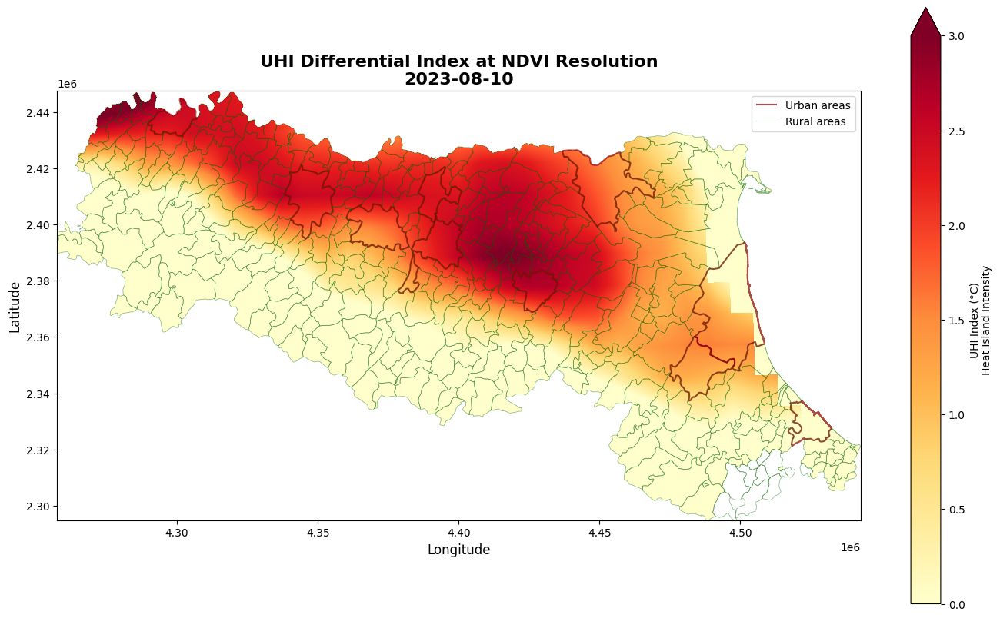

In [20]:
# =============================================================================
# Visualize UHI at NDVI Resolution (positive values only)
# =============================================================================

# Clip UHI data to region boundaries only
UHI_ndvi_res_clipped = UHI_ndvi_res.rio.clip(gadm_region_flat.to_crs(UHI_ndvi_res.rio.crs).geometry, drop=True)

fig, axes = plt.subplots(figsize=(14, 10))

# Plot UHI at NDVI resolution (only positive values, 0 to max)
UHI_ndvi_res_clipped.plot(
    ax=axes,
    cmap="YlOrRd",  # Yellow-Orange-Red for heat intensity
    vmin=0,
    vmax=3,
    cbar_kwargs={"label": "UHI Index (°C)\nHeat Island Intensity", "shrink": 0.8},
)

# Overlay boundaries
urban_gadm_gdf.to_crs(UHI_ndvi_res_clipped.rio.crs).boundary.plot(
    ax=axes, edgecolor="darkred", linewidth=1.5, alpha=0.7, label="Urban areas"
)
rural_gadm_gdf.to_crs(UHI_ndvi_res_clipped.rio.crs).boundary.plot(
    ax=axes, edgecolor="darkgreen", linewidth=0.5, alpha=0.5, label="Rural areas"
)

axes.set_title(f"UHI Differential Index at NDVI Resolution\n{era5_day}", fontsize=16, fontweight="bold")
axes.set_xlabel("Longitude", fontsize=12)
axes.set_ylabel("Latitude", fontsize=12)
axes.set_aspect("equal")
axes.legend(loc="upper right", fontsize=10)

plt.tight_layout()
plt.show()

### Urban Heat Island Composite Index (UHICI)

To better quantify the Urban Heat Island effect, we can create a composite index called the Urban Heat Island Composite Index (UHICI). This index combines temperature, vegetation cover (NDVI), and urbanization level (DEGURBA) to provide a more comprehensive measure of heat island intensity.

We define the UHICI as follows:

**Urban Heat Island Composite Index (UHICI)**

The UHICI is the weighted sum of three normalized components:

- Maximum daily temperature ($T_{\text{max}}$)
- Normalized Difference Vegetation Index (NDVI)
- DEGURBA classification (urbanization level)

**Formula:**

$$\text{UHICI} = N\Big(w_1 \cdot N(T_{\text{max}}) + w_2 \cdot (1 - N(\text{NDVI})) + w_3 \cdot (1 - N(\text{DEGURBA}))\Big)$$

Where:

- $N(x) = \frac{x - \min}{\max - \min}$ normalizes values to [0, 1]
- Higher **temperature** → increases index (heat stress)
- Higher **NDVI** → decreases index (vegetation cools)
- **Urban** areas → increases index (heat vulnerability)
- $w_1, w_2, w_3$ = weights for each component (don't need to sum to 1 due to final normalization)

**Output**: 0 (coolest) to 1 (hottest heat island effect)

### UHICI Analysis

In this section we will use the just defined UHICI index with two different datasets.

- ERA5-Land temperature data, interpolated to match the NDVI resolution
- ECA temperature data, interpolated with a nearest-neighbor approach to match the NDVI resolution


In [21]:
def normalize(data):
    """Min-Max normalize xarray DataArray."""
    data_min = data.min()
    data_max = data.max()
    normalized = (data - data_min) / (data_max - data_min)
    return normalized


def UHICI(temperature, ndvi, degurba, weights: tuple[float, float, float]):
    """Compute Urban Heat Island Composite Index (UHICI)."""
    uhici = (
        weights[0] * (normalize(temperature))
        + weights[1] * (1 - normalize(ndvi))
        + weights[2] * (1 - normalize(degurba))
    )

    # Normalize the final index to [0, 1] range
    uhici = normalize(uhici)

    return uhici

To compute the UHICI, we need to prepare the three components: temperature, NDVI, and DEGURBA classification. We will do that using `xarray` DataArrays.

In [22]:
def create_degurba_raster(gdf_urban, gdf_rural, reference_raster):
    """
    Create a DEGURBA raster matching the reference raster's grid.

    Parameters:
        gdf_urban: GeoDataFrame of urban areas (DEGURBA = 1)
        gdf_rural: GeoDataFrame of rural areas (DEGURBA = 2 or 3)
        reference_raster: xarray DataArray to match (e.g., NDVI or temperature)

    Returns:
        xarray DataArray with DEGURBA values (1 for urban, 2/3 for rural)
    """
    from rasterio import features

    # Get the reference raster properties
    height, width = reference_raster.shape
    transform = reference_raster.rio.transform()
    crs = reference_raster.rio.crs

    # Reproject GeoDataFrames to match reference CRS
    gdf_urban_reproj = gdf_urban.to_crs(crs)
    gdf_rural_reproj = gdf_rural.to_crs(crs)

    # Create empty raster
    degurba_array = np.zeros((height, width), dtype=np.float32)

    # Burn rural areas (value = 2.5 as average of 2 and 3)
    if not gdf_rural_reproj.empty:
        rural_shapes = ((geom, 2.5) for geom in gdf_rural_reproj.geometry)
        features.rasterize(rural_shapes, out=degurba_array, transform=transform, fill=0, dtype=np.float32)
    else:
        warnings.warn("Rural GeoDataFrame is empty; no rural areas will be rasterized.")

    # Burn urban areas (value = 1, will overwrite rural where they overlap)
    if not gdf_urban_reproj.empty:
        urban_shapes = ((geom, 1.0) for geom in gdf_urban_reproj.geometry)
        features.rasterize(urban_shapes, out=degurba_array, transform=transform, all_touched=False, dtype=np.float32)
    else:
        warnings.warn("Urban GeoDataFrame is empty; no urban areas will be rasterized.")

    # Create xarray DataArray from numpy array
    degurba_xr = xr.DataArray(degurba_array, coords={"y": reference_raster.y, "x": reference_raster.x}, dims=["y", "x"])

    # Set spatial metadata
    degurba_xr.rio.write_crs(crs, inplace=True)
    degurba_xr.rio.write_transform(transform, inplace=True)

    # Mask areas outside municipalities (set to NaN)
    degurba_xr = degurba_xr.where(degurba_xr.values > 0)

    return degurba_xr

In [23]:
def create_eca_raster(
    stations_gdf: gpd.GeoDataFrame,
    reference_raster: xr.DataArray,
    value_column: str,
):
    """
    Create a raster from ECA&D station data matching the reference raster's grid.

    Parameters:
        stations_gdf: GeoDataFrame with station locations and values
        reference_raster: xarray DataArray to match (e.g., NDVI or temperature)
        value_column: Column name in stations_gdf containing the values to rasterize
    Returns:
        xarray DataArray with rasterized station values
    """
    from scipy.spatial import cKDTree

    # Get the reference raster properties
    height, width = reference_raster.shape
    transform = reference_raster.rio.transform()
    crs = reference_raster.rio.crs

    # Reproject stations to match reference CRS
    stations_reproj = stations_gdf.to_crs(crs)

    # Create empty raster
    station_array = np.full((height, width), np.nan, dtype=np.float32)

    station_coords = []
    station_values = []

    # Populate with station data
    for idx, row in stations_reproj.iterrows():
        station_lon = row.geometry.x
        station_lat = row.geometry.y
        station_value = row[value_column]

        # Compute pixel indices
        x_idx = int((station_lon - transform[2]) / transform[0])
        y_idx = int((station_lat - transform[5]) / transform[4])

        if 0 <= x_idx < width and 0 <= y_idx < height:
            station_array[y_idx, x_idx] = station_value
            station_coords.append([y_idx, x_idx])
            station_values.append(station_value)

    station_coords = np.array(station_coords)
    station_values = np.array(station_values)

    # Build KDTree for fast nearest neighbor lookup
    kdtree = cKDTree(station_coords)

    # Vectorized approach: find all NaN pixels at once
    nan_mask = np.isnan(station_array)
    nan_indices = np.argwhere(nan_mask)

    if len(nan_indices) > 0:
        # Query the KDTree for nearest neighbors
        distances, indices = kdtree.query(nan_indices)

        # Fill in the NaN values
        for (i, j), station_idx in zip(nan_indices, indices):
            station_array[i, j] = station_values[station_idx]

    station_da = xr.DataArray(
        station_array,
        dims=["y", "x"],
        coords={"y": reference_raster.y, "x": reference_raster.x},
    )

    return station_da

In [24]:
degurba_raster = create_degurba_raster(urban_gadm_gdf, rural_gadm_gdf, ndvi_region)
print(
    f"DEGURBA raster shape: {degurba_raster.shape}"
    f"\n\tCRS: {degurba_raster.rio.crs}"
    f"\n\tNaN count: {np.isnan(degurba_raster).sum().item()} ({100 * np.isnan(degurba_raster).sum().item() / degurba_raster.size:.2f}%)"
)

DEGURBA raster shape: (1910, 3568)
	CRS: EPSG:3035
	NaN count: 3302096 (48.45%)


In [25]:
region_stations = stations_gdf[stations_gdf.within(gadm_bigger_region.union_all(method="coverage"))]
region_stations_tx = eca_read_all_stations_tx(
    [f"../processed/ECA_blend_tx/TX_STAID{id:06d}.txt" for id in region_stations["STAID"]]
)

region_stations_tx = region_stations_tx.merge(
    region_stations[["STAID", "geometry"]], left_on="STAID", right_on="STAID", how="left"
)
region_stations_tx_gdf = gpd.GeoDataFrame(region_stations_tx, geometry="geometry", crs=stations_gdf.crs)
print(f"ECA&D TX stations in region: {region_stations_tx_gdf.shape}\n\tCRS: {region_stations_tx_gdf.crs}")


Reading station TX data: 100%|███████████████████████████████████| 1111/1111 [00:53<00:00, 20.83it/s]


ECA&D TX stations in region: (5931397, 5)
	CRS: EPSG:4326


In [26]:
eca_day = era5_day
eca_raster = create_eca_raster(region_stations_tx_gdf[region_stations_tx_gdf["DATE"] == eca_day], ndvi_region, "TX")

print(
    f"ECA&D raster shape: {eca_raster.shape}"
    f"\n\tCRS: {eca_raster.rio.crs}"
    f"\n\tNaN count: {np.isnan(eca_raster).sum().item()} ({100 * np.isnan(eca_raster).sum().item() / eca_raster.size:.2f}%)"
)

ECA&D raster shape: (1910, 3568)
	CRS: None
	NaN count: 0 (0.00%)


In [27]:
gadm_bigger_region = gadm_gdf[gadm_gdf["GID_0"] == "ITA"].dissolve()

# Clip ERA5 to a larger reagion of interest to avoid missing data at the edges
era5_region = era5_xr.rio.clip(gadm_bigger_region.geometry, gadm_bigger_region.crs, drop=True, invert=True)
era5_region = era5_region.sel(valid_time=era5_day)

uhici_era = UHICI(era5_region_t2m, ndvi_region, degurba_raster, weights=(0.3, 0.6, 0.1))
uhici_eca = UHICI(eca_raster, ndvi_region, degurba_raster, weights=(0.3, 0.6, 0.1))

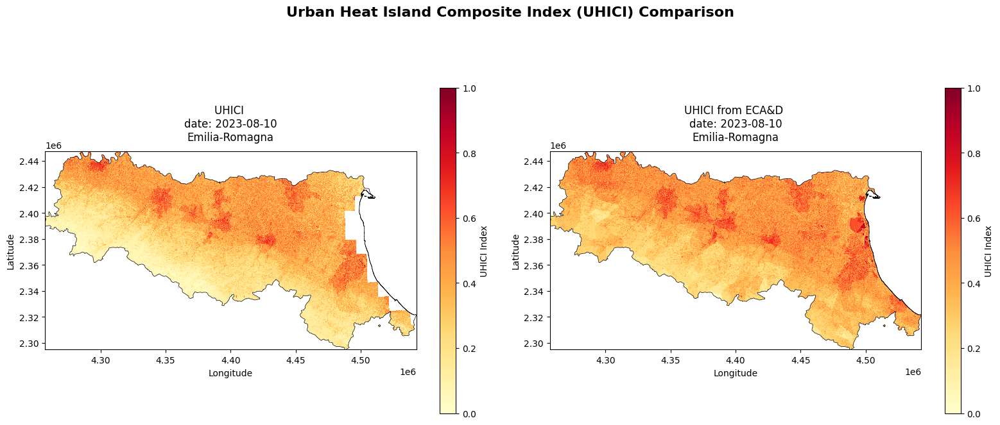

In [28]:
# plot uhici dataarray over Emilia-Romagna map
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
uhici_era.plot(
    ax=axes[0],
    cmap="YlOrRd",
    vmin=uhici_era.min().values,
    vmax=uhici_era.max().values,
    cbar_kwargs={"label": "UHICI Index", "shrink": 0.8},
)
gadm_region.to_crs(uhici_era.rio.crs).dissolve("GID_2").plot(
    ax=axes[0], facecolor="none", edgecolor="black", linewidth=0.5
)

axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].set_title(f"UHICI \ndate: {era5_day}\nEmilia-Romagna", fontsize=12, pad=12)

uhici_eca.plot(
    ax=axes[1],
    cmap="YlOrRd",
    vmin=uhici_eca.min().values,
    vmax=uhici_eca.max().values,
    cbar_kwargs={"label": "UHICI Index", "shrink": 0.8},
)
gadm_region.to_crs(uhici_eca.rio.crs).dissolve("GID_2").plot(
    ax=axes[1], facecolor="none", edgecolor="black", linewidth=0.5
)
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].set_title(f"UHICI from ECA&D \ndate: {eca_day}\nEmilia-Romagna", fontsize=12, pad=12)

fig.suptitle("Urban Heat Island Composite Index (UHICI) Comparison", fontsize=16, fontweight="bold", y=1.02)

plt.tight_layout()
plt.show()

We can zoom on the city of Bologna to visualize the UHICI index more clearly.

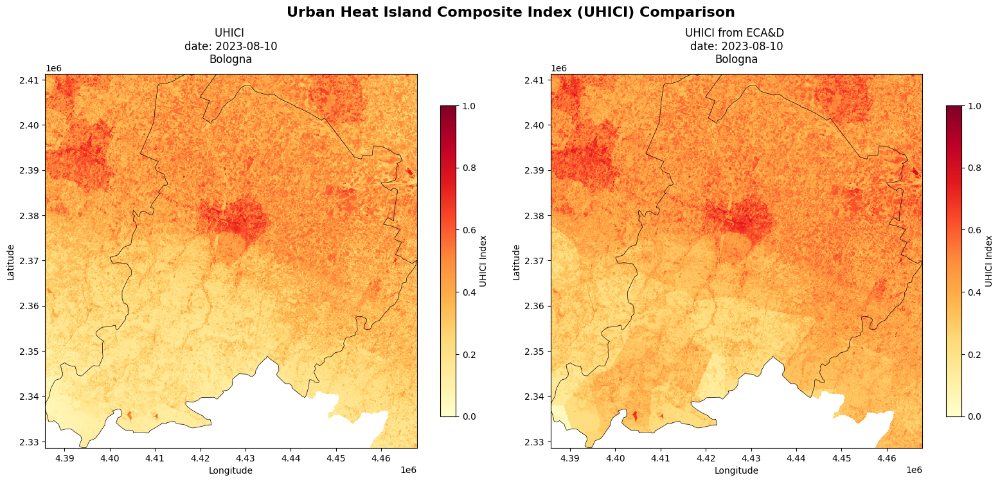

In [29]:
# plot uhici dataarray over Emilia-Romagna map
bologna_region = gadm_gdf[gadm_gdf["NAME_2"] == "Bologna"].dissolve()

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
uhici_era.plot(
    ax=axes[0],
    cmap="YlOrRd",
    vmin=uhici_era.min().values,
    vmax=uhici_era.max().values,
    cbar_kwargs={"label": "UHICI Index", "shrink": 0.8},
)
bologna_region.to_crs(uhici_era.rio.crs).plot(ax=axes[0], facecolor="none", edgecolor="black", linewidth=0.5)

axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].set_title(f"UHICI \ndate: {era5_day}\nBologna", fontsize=12, pad=12)
axes[0].set_xlim(bologna_region.to_crs(uhici_era.rio.crs).total_bounds[[0, 2]])
axes[0].set_ylim(bologna_region.to_crs(uhici_era.rio.crs).total_bounds[[1, 3]])

uhici_eca.plot(
    ax=axes[1],
    cmap="YlOrRd",
    vmin=uhici_eca.min().values,
    vmax=uhici_eca.max().values,
    cbar_kwargs={"label": "UHICI Index", "shrink": 0.8},
)
bologna_region.to_crs(uhici_eca.rio.crs).plot(
    ax=axes[1], facecolor="none", edgecolor="black", linewidth=0.5
)
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].set_title(f"UHICI from ECA&D \ndate: {eca_day}\nBologna", fontsize=12, pad=12)
axes[1].set_xlim(bologna_region.to_crs(uhici_eca.rio.crs).total_bounds[[0, 2]])
axes[1].set_ylim(bologna_region.to_crs(uhici_eca.rio.crs).total_bounds[[1, 3]])

fig.suptitle("Urban Heat Island Composite Index (UHICI) Comparison", fontsize=16, fontweight="bold", y=1.02)

plt.tight_layout()
plt.show()

#### UHICI vs NDVI

We can also visualize the relation between UHICI and NDVI values to see how vegetation impacts urban heat intensity.


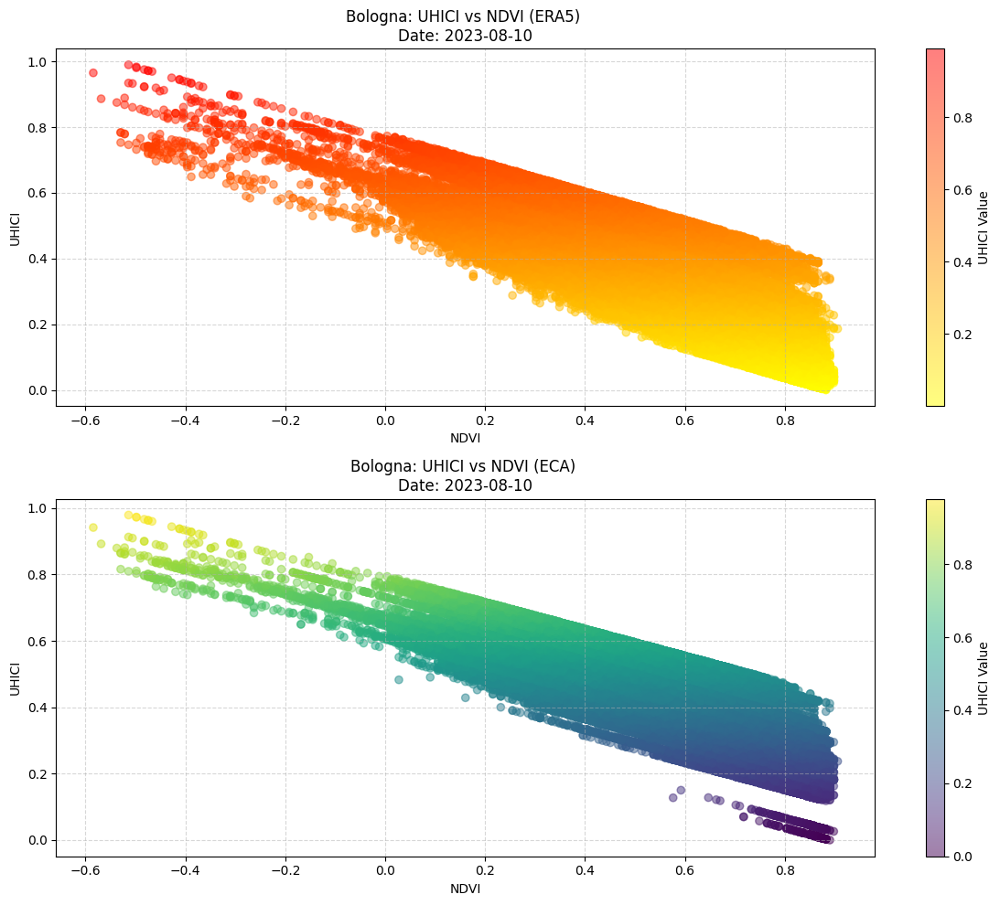

In [30]:
# Flatten arrays
ndvi_region_flat = ndvi_region.values.flatten()

uhici_era_flat = uhici_era.values.flatten()
uhici_eca_flat = uhici_eca.values.flatten()

# Remove NaNs (if any) and keep only valid pairs
er_valid_mask = ~np.isnan(ndvi_region_flat) & ~np.isnan(uhici_era_flat) & ~np.isnan(uhici_eca_flat)
er_ndvi_valid = ndvi_region_flat[er_valid_mask]

er_uhici_era_valid = uhici_era_flat[er_valid_mask]  # ERA5
er_uhici_eca_valid = uhici_eca_flat[er_valid_mask]  # ECA


# Randomly sample 1% of the data
def random_sample(data, fraction=0.01, seed=42):
    np.random.seed(seed)
    sample_size = max(1, int(fraction * len(data)))
    sample_indices = np.random.choice(len(data), size=sample_size, replace=False)
    return data[sample_indices]


er_ndvi_sample = random_sample(er_ndvi_valid, fraction=0.1)
er_uhici_era_sample = random_sample(er_uhici_era_valid, fraction=0.1)  # ERA5
er_uhici_eca_sample = random_sample(er_uhici_eca_valid, fraction=0.1)  # ECA


# Create a white->yellow->red linear colormap and plotting

cmap_wyr = LinearSegmentedColormap.from_list("wyr", ["yellow", "red"])

# Single scatter plot of sampled UHICI with color gradient vs sampled NDVI
fig, axes = plt.subplots(2, 1, figsize=(12, 10))
scatter = axes[0].scatter(
    x=er_ndvi_sample,
    y=er_uhici_era_sample,
    c=er_uhici_era_sample,
    cmap=cmap_wyr,
    alpha=0.5,
)
cbar = plt.colorbar(scatter, ax=axes[0])
cbar.set_label("UHICI Value")

axes[0].set_xlabel("NDVI")
axes[0].set_ylabel("UHICI")
axes[0].set_title("Bologna: UHICI vs NDVI (ERA5) \nDate: " + era5_day)
axes[0].grid(True, linestyle="--", alpha=0.5)

scatter = axes[1].scatter(
    x=er_ndvi_sample,
    y=er_uhici_eca_sample,
    c=er_uhici_eca_sample,
    cmap="viridis",
    alpha=0.5,
)

cbar = plt.colorbar(scatter, ax=axes[1])
cbar.set_label("UHICI Value")

axes[1].set_xlabel("NDVI")
axes[1].set_ylabel("UHICI")
axes[1].set_title("Bologna: UHICI vs NDVI (ECA) \nDate: " + era5_day)
axes[1].grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

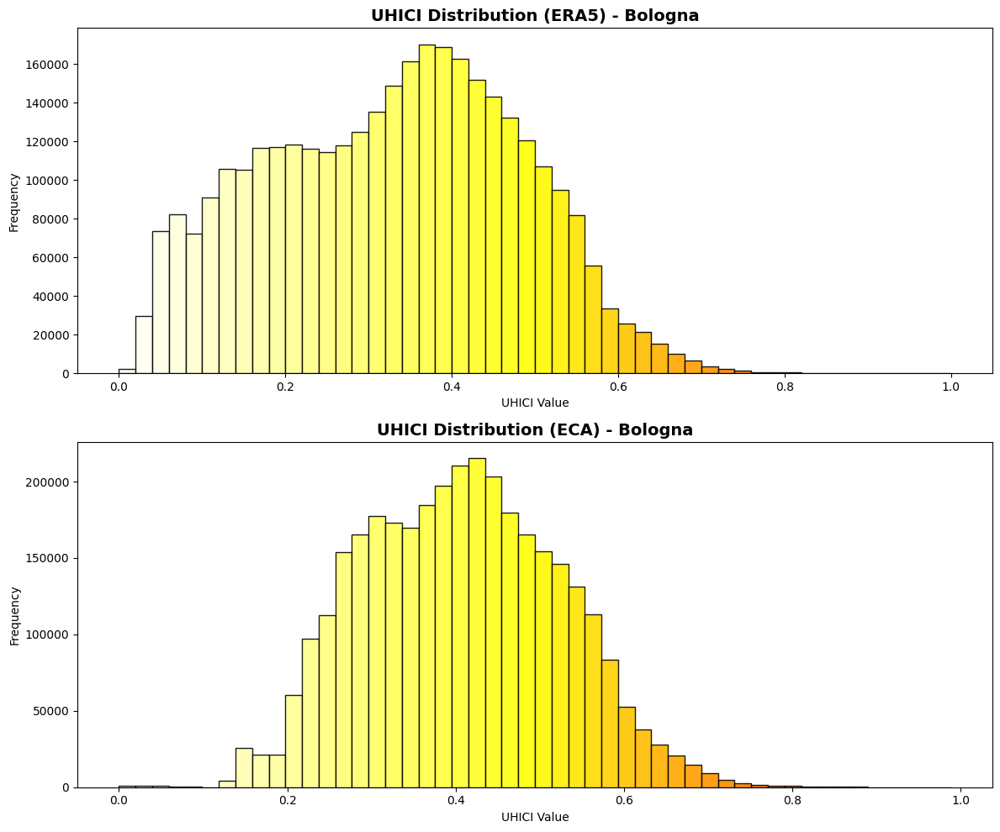

In [31]:
def plot_uhci_distribution(uhici_era_flat: np.ndarray, ax=None):
    """Plot the distribution of UHICI values with colored bars."""
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.colors import LinearSegmentedColormap, Normalize

    # Remove NaN values
    uhici_era_flat = uhici_era_flat[~np.isnan(uhici_era_flat)]

    # Binning
    bins = 50
    data_min = np.nanmin(uhici_era_flat) if len(uhici_era_flat) > 0 else 0
    data_max = np.nanmax(uhici_era_flat) if len(uhici_era_flat) > 0 else 1
    bin_edges = np.linspace(data_min, data_max, bins + 1)

    # Create white->yellow->red colormap for bar coloring
    cmap_wyr = LinearSegmentedColormap.from_list("wyr", ["white", "yellow", "red"])
    norm = Normalize(vmin=data_min, vmax=data_max)

    # Compute histogram
    counts, _ = np.histogram(uhici_era_flat, bins=bin_edges)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    bin_width = bin_edges[1] - bin_edges[0]

    # Map colors from bin centers
    colors = cmap_wyr(norm(bin_centers))

    # Plot histogram
    ax = ax or plt.gca()
    ax.bar(bin_centers, counts, width=bin_width, color=colors, edgecolor="black", alpha=0.9)


fig, axes = plt.subplots(2, 1, figsize=(12, 10))

plot_uhci_distribution(er_uhici_era_valid, ax=axes[0])
axes[0].set_title("UHICI Distribution (ERA5) - Bologna", fontsize=14, fontweight="bold")
axes[0].set_xlabel("UHICI Value")
axes[0].set_ylabel("Frequency")

plot_uhci_distribution(er_uhici_eca_valid, ax=axes[1])
axes[1].set_title("UHICI Distribution (ECA) - Bologna", fontsize=14, fontweight="bold")
axes[1].set_xlabel("UHICI Value")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

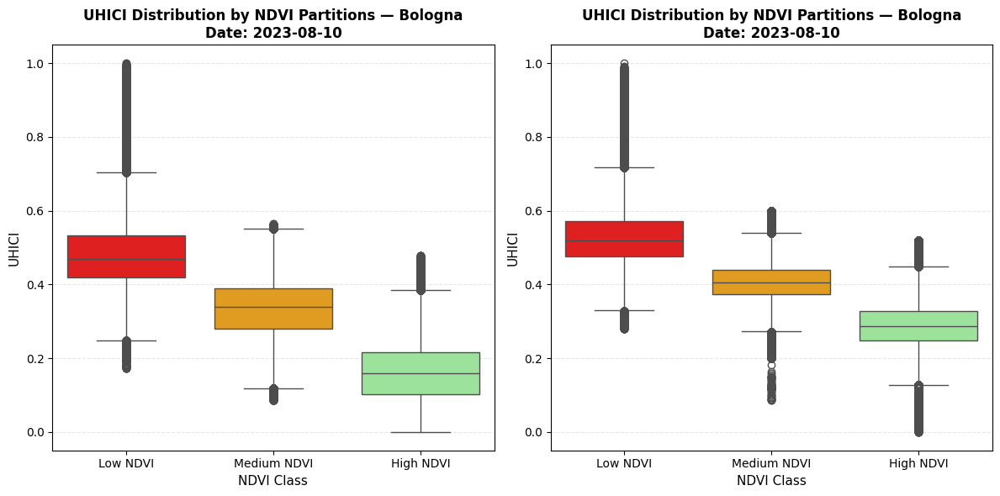

In [32]:
# Calculate 3 equal partitions of NDVI (terciles) for Emilia-Romagna
# Emilia-Romagna arrays


def ndvi_terciles_boxplot(ndvi_region: xr.DataArray, uhici: xr.DataArray, ax=None):
    """Create a boxplot of UHICI values partitioned by NDVI terciles."""
    # Flatten arrays
    ndvi_region_flat = ndvi_region.values.flatten()
    uhici_flat = uhici.values.flatten()
    mask_e = ~np.isnan(ndvi_region_flat) & ~np.isnan(uhici_flat)
    ndvi_e_valid = ndvi_region_flat[mask_e]
    uhici_e_valid = uhici_flat[mask_e]

    # Compute terciles
    ndvi_e_partitions = np.percentile(ndvi_e_valid, [33.33, 66.66]) if len(ndvi_e_valid) > 0 else (0, 0)

    # Prepare data for violin plot
    partition_labels = ["Low NDVI", "Medium NDVI", "High NDVI"]
    violin_data = []
    violin_labels = []

    for i in range(3):
        if i == 0:
            mask_i = ndvi_e_valid <= ndvi_e_partitions[0]
        elif i == 1:
            mask_i = (ndvi_e_valid > ndvi_e_partitions[0]) & (ndvi_e_valid <= ndvi_e_partitions[1])
        else:
            mask_i = ndvi_e_valid > ndvi_e_partitions[1]

        uhici_partition = uhici_e_valid[mask_i]
        if len(uhici_partition) > 0:
            violin_data.extend(uhici_partition)
            violin_labels.extend([partition_labels[i]] * len(uhici_partition))

    # Create DataFrame for violin plot
    boxplot_df = pd.DataFrame({"NDVI Class": violin_labels, "UHICI": violin_data})

    ax = ax or plt.gca()
    sns.boxplot(
        data=boxplot_df,
        x="NDVI Class",
        y="UHICI",
        order=partition_labels,
        hue="NDVI Class",
        legend=False,
        palette=["red", "orange", "lightgreen"],
        ax=ax,
    )


# Plot violin plot
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
ndvi_terciles_boxplot(ndvi_region, uhici_era, ax=axes[0])
axes[0].set_title("UHICI Distribution by NDVI Partitions — Bologna\nDate: " + era5_day, fontsize=12, fontweight="bold")
axes[0].set_xlabel("NDVI Class", fontsize=11)
axes[0].set_ylabel("UHICI", fontsize=11)
axes[0].grid(True, linestyle="--", alpha=0.3, axis="y")

ndvi_terciles_boxplot(ndvi_region, uhici_eca, ax=axes[1])
axes[1].set_title("UHICI Distribution by NDVI Partitions — Bologna\nDate: " + era5_day, fontsize=12, fontweight="bold")
axes[1].set_xlabel("NDVI Class", fontsize=11)
axes[1].set_ylabel("UHICI", fontsize=11)
axes[1].grid(True, linestyle="--", alpha=0.3, axis="y")

plt.tight_layout()
plt.show()

## 2. Explaining the UHI Effect: TX - NDVI Correlation Analysis

To explain the UHI effect further, we can analyze the correlation between maximum daily temperature (TX) and NDVI values across our region of interest.

We will focus on the city of Bologna to limit the number of data points and make the analysis more manageable, but the same approach can be applied to other cities or the entire region.

To do this, we will:

- Load station TX data and NDVI data for the region.
- For each station, compute the mean NDVI in a 1km buffer around the station.
- For each period (e.g., monthly, seasonal), compute the mean TX for each station

Then, for each period we will:

- Plot the TX time series for stations colored by their NDVI values.
- Calculate and plot the correlation between TX and NDVI with a regression line.


In [33]:
bologna_region_gdf = gadm_gdf[gadm_gdf["NAME_2"] == "Bologna"]
bologna_region_union = bologna_region_gdf.dissolve()
bologna_stations_gdf = stations_gdf[stations_gdf.within(bologna_region_union.union_all())]

print(f"Region has {len(bologna_stations_gdf)} stations.")
display(bologna_stations_gdf.sample(5))

Region has 60 stations.


,STAID,STANAME,CN,HGHT,geometry
4454,17546,BUDRIO_DONDINA,IT,30,POINT (11.54944 44.52167)
4478,17580,CASTEL_SAN_PIETRO,IT,58,POINT (11.59667 44.41083)
4464,17563,CASALECCHIO_CANALE,IT,63,POINT (11.28056 44.47556)
4524,17643,INVASO,IT,460,POINT (11.22167 44.22694)
1170,2807,DIGA DI PAVANA,IT,480,POINT (11.00556 44.11806)


Let's visualize the stations in the selected region first:

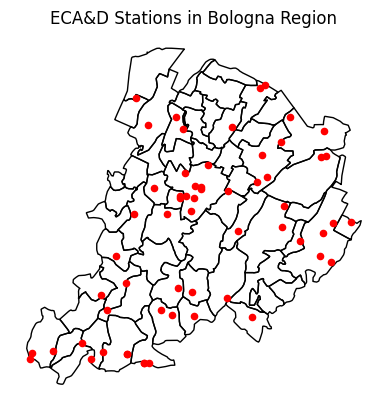

In [34]:
fig, axes = plt.subplots()
bologna_region_gdf.plot(facecolor="none", edgecolor="black", linewidth=1, ax=axes)
bologna_stations_gdf.plot(ax=axes, color="red", markersize=20)
plt.title("ECA&D Stations in Bologna Region")
plt.axis("off")
plt.show()

Before continuing, we need to define some utility functions:

In [35]:
def _load_station_tx_data(stations_in_region: gpd.GeoDataFrame, eca_data_path: str) -> pd.DataFrame:
    station_paths = [f"{eca_data_path}/TX_STAID{sid:06d}.txt" for sid in stations_in_region["STAID"]]

    stations_tx_df = eca_read_all_stations_tx(station_paths)

    # Merge observations with station metadata
    stations_tx_df = stations_tx_df.merge(
        stations_in_region[["STAID", "STANAME", "geometry"]],
        on="STAID",
        how="left",
    )

    return stations_tx_df

In [36]:
ndvi_period_to_season = {
    r"(\d{4})-12-01_(\d{4})-03-01": "Winter",
    r"(\d{4})-03-01_(\d{4})-06-01": "Spring",
    r"(\d{4})-06-01_(\d{4})-09-01": "Summer",
    r"(\d{4})-09-01_(\d{4})-12-01": "Autumn",
}


def ndvi_name_to_season(ndvi_name: str) -> str:
    import re

    for pattern, season_name in ndvi_period_to_season.items():
        if re.match(pattern, ndvi_name):
            return season_name

    return "Unknown"

In [37]:
def _get_ndvi_periods(ndvi_files_pattern: str) -> list[dict]:
    import glob
    import re

    ndvi_files = glob.glob(ndvi_files_pattern)
    ndvi_periods = []
    for ndvi_file in ndvi_files:
        match = re.search(r"ndvi_(\d{4}-\d{2}-\d{2})_(\d{4}-\d{2}-\d{2})\.tif", ndvi_file)

        if not match:
            continue

        start_date = pd.to_datetime(match.group(1))
        end_date = pd.to_datetime(match.group(2))
        ndvi_periods.append(
            {
                "file": ndvi_file,
                "start_date": start_date,
                "end_date": end_date,
                "period_str": f"{match.group(1)}_{match.group(2)}",
            }
        )

    return ndvi_periods

In [38]:
def _calculate_station_ndvi(
    station_gdf: gpd.GeoDataFrame,
    ndvi_data: xr.DataArray,
    buffer_meters: float,
) -> float:
    """
    Calculate mean NDVI around a station within a buffer in meters.

    Parameters:
    - station_gdf: GeoDataFrame with a single station point geometry.
    - ndvi_data: xarray DataArray with NDVI data.
    - buffer_meters: Buffer radius in meters.
    """

    # we need a projected CRS in meters
    station_m = station_gdf.to_crs("EPSG:3857")
    buffer_m = station_m.geometry.buffer(buffer_meters)

    # reproject back to raster CRS
    buffer_m = buffer_m.to_crs(ndvi_data.rio.crs)

    ndvi_subset = ndvi_data.rio.clip([buffer_m.iloc[0]], drop=True)
    mean_ndvi = float(ndvi_subset.mean().values)
    return mean_ndvi


Now we can proceed with the TX-NDVI correlation analysis and visualizations.

To calculate the correlation between TX and NDVI for each station, we will first create a dataframe that contains for each NDVI period the mean TX and mean NDVI for each station.

In [39]:
def prepare_tx_ndvi_corr_df(
    region_gdf: gpd.GeoDataFrame,
    stations_gdf: gpd.GeoDataFrame,
    ndvi_files_pattern: str = "../data/sentinel2_ndvi/ndvi_*.tif",
    buffer_meters: float = 1000.0,
    eca_data_path: str = "../processed/ECA_blend_tx",
) -> pd.DataFrame:
    import warnings

    stations_in_region = stations_gdf[stations_gdf.within(region_gdf.union_all(method="coverage"))]

    if stations_in_region.empty:
        print("Warning: No stations found in region")
        return pd.DataFrame()

    stations_tx_df = _load_station_tx_data(stations_in_region, eca_data_path)
    ndvi_periods = _get_ndvi_periods(ndvi_files_pattern)

    results = []
    total_steps = len(ndvi_periods) * len(stations_in_region)

    with tqdm(total=total_steps, desc="TX-NDVI") as pbar:
        for period in ndvi_periods:
            pbar.set_postfix_str(f"Period: {period['period_str']}")
            period_str = period["period_str"]

            ndvi_data = ndvi_read_xr_bbox_clip(period["file"], region_gdf)
            ndvi_data = ndvi_data.compute()  # eagerly load for faster access

            stations_tx = stations_tx_df[
                (stations_tx_df["DATE"] >= period["start_date"]) & (stations_tx_df["DATE"] <= period["end_date"])
            ]

            if len(stations_tx) == 0:
                warnings.warn(f"No TX data for period {period_str}")
                continue

            stations_avg_tx = stations_tx.groupby("STAID")["TX"].mean()

            for _, station_row in stations_in_region.iterrows():
                pbar.update(1)

                staid = station_row["STAID"]
                staname = station_row["STANAME"]

                if staid not in stations_avg_tx.index:
                    # no TX data for this station in this period
                    continue

                avg_tx = stations_avg_tx[staid]

                station_gdf = gpd.GeoDataFrame([station_row], geometry="geometry", crs=stations_in_region.crs)
                mean_ndvi = _calculate_station_ndvi(station_gdf, ndvi_data, buffer_meters)

                if np.isnan(mean_ndvi):
                    warnings.warn(f"NaN NDVI for station {staid} ({staname}) in period {period_str}")
                    continue

                result = {
                    "STAID": staid,
                    "STANAME": station_row["STANAME"],
                    "period": period["period_str"],
                    "start_date": period["start_date"],
                    "end_date": period["end_date"],
                    "avg_TX": avg_tx,
                    "mean_NDVI_2km": mean_ndvi,
                    "lon": station_row.geometry.x,
                    "lat": station_row.geometry.y,
                }
                results.append(result)

    results_df = pd.DataFrame(results)
    return results_df


In [40]:
tx_ndvi_df = prepare_tx_ndvi_corr_df(
    region_gdf=bologna_region_union,
    stations_gdf=bologna_stations_gdf,
    buffer_meters=1000,
)

print(f"Total results: {len(tx_ndvi_df)} station-period combinations")
tx_ndvi_df.head()

TX-NDVI: 100%|██████████████████████| 960/960 [01:40<00:00,  9.53it/s, Period: 2023-09-01_2023-12-01]

Total results: 864 station-period combinations


,STAID,STANAME,period,start_date,end_date,avg_TX,mean_NDVI_2km,lon,lat
0,861,MONZUNO,2020-03-01_2020-06-01,2020-03-01,2020-06-01,20.481250,0.576191,11.273333,44.276667
1,862,PORRETTA TERME,2020-03-01_2020-06-01,2020-03-01,2020-06-01,21.684848,0.494197,10.976944,44.154167
2,2791,CASTEL DEL RIO,2020-03-01_2020-06-01,2020-03-01,2020-06-01,23.690909,0.605687,11.505000,44.210833
3,2804,COTTEDE,2020-03-01_2020-06-01,2020-03-01,2020-06-01,18.918182,0.682569,11.169167,44.109444
4,2805,DIGA DEL BRASIMONE,2020-03-01_2020-06-01,2020-03-01,2020-06-01,17.184375,0.415361,11.117778,44.129167


We can now visualize the timeseries of TX for the stations in the region, colored by their NDVI values.

Plotting periods: 100%|██████████████████████████████████████████████| 16/16 [00:07<00:00,  2.23it/s]


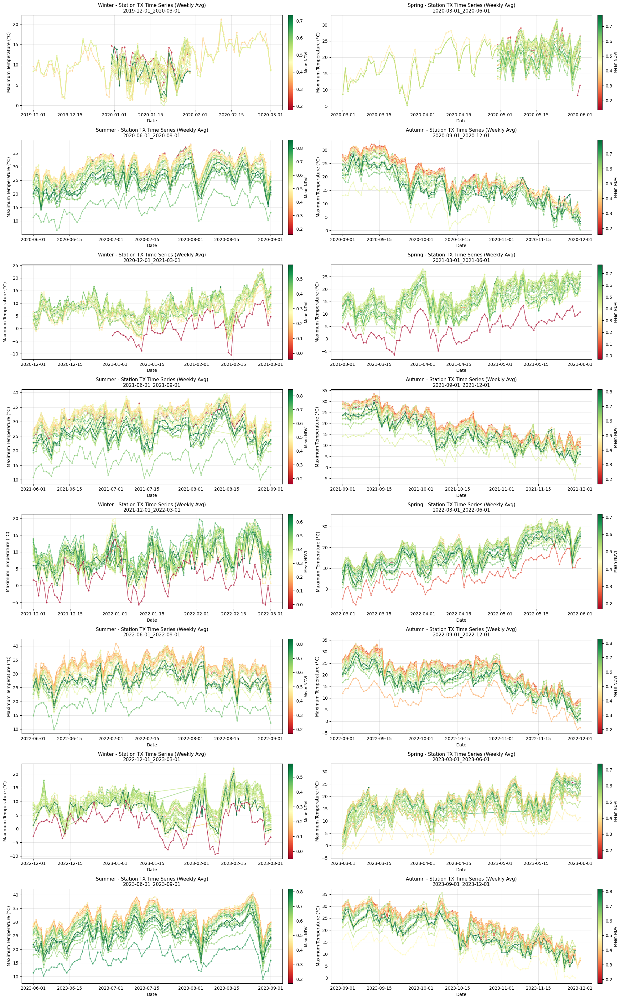

In [41]:
def display_station_tx_timeseries(
    region_gdf: gpd.GeoDataFrame,
    stations_gdf: gpd.GeoDataFrame,
    tx_ndvi_df: pd.DataFrame,
    eca_data_path: str = "../processed/ECA_blend_tx",
):
    from matplotlib import cm
    from matplotlib.colors import Normalize

    stations_in_region = stations_gdf[stations_gdf.within(region_gdf.union_all(method="coverage"))]

    if stations_in_region.empty:
        warnings.warn("No stations found in region")
        return

    stations_tx_df = _load_station_tx_data(stations_in_region, eca_data_path)

    # Get unique periods from tx_ndvi_df
    periods = sorted(tx_ndvi_df["period"].unique())

    num_plots = len(periods)
    ncols = 2
    nrows = max(math.ceil(num_plots / ncols), 1)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(10 * ncols, 4.0 * nrows),
        squeeze=False,
    )
    axes_flat = axes.ravel()

    # Colormap for NDVI values
    cmap = plt.colormaps["RdYlGn"]

    for i, period_str in tqdm(list(enumerate(periods)), desc="Plotting periods"):
        ax = axes_flat[i]

        # Detect season from period string
        season = ndvi_name_to_season(period_str)

        # Get NDVI data for this period from pre-calculated results
        period_ndvi = tx_ndvi_df[tx_ndvi_df["period"] == period_str][["STAID", "mean_NDVI_2km"]].copy()

        if period_ndvi.empty:
            ax.text(
                0.5,
                0.5,
                "No NDVI data",
                ha="center",
                va="center",
                transform=ax.transAxes,
            )
            ax.set_title(f"{season} - {period_str}")
            continue

        start_date = tx_ndvi_df[tx_ndvi_df["period"] == period_str]["start_date"].iloc[0]
        end_date = tx_ndvi_df[tx_ndvi_df["period"] == period_str]["end_date"].iloc[0]

        # Filter TX data for this period
        period_tx = stations_tx_df[(stations_tx_df["DATE"] >= start_date) & (stations_tx_df["DATE"] <= end_date)].copy()

        if len(period_tx) == 0:
            warnings.warn(f"No TX data for period {period_str}")
            ax.text(
                0.5,
                0.5,
                "No TX data",
                ha="center",
                va="center",
                transform=ax.transAxes,
            )
            ax.set_title(f"Period: {period_str}")
            continue

        # Merge NDVI values directly into TX data using DataFrame operations
        period_tx_with_ndvi = period_tx.merge(period_ndvi, on="STAID", how="inner")

        if period_tx_with_ndvi.empty:
            continue

        # Normalize NDVI values for color mapping
        ndvi_min = period_tx_with_ndvi["mean_NDVI_2km"].min()
        ndvi_max = period_tx_with_ndvi["mean_NDVI_2km"].max()
        norm = Normalize(vmin=ndvi_min, vmax=ndvi_max)

        # Plot each station's time series with NDVI-based color using seaborn with weekly averaging
        for staid, station_group in period_tx_with_ndvi.groupby("STAID"):
            ndvi_val = station_group["mean_NDVI_2km"].iloc[0]
            color = cmap(norm(ndvi_val))

            sns.lineplot(
                data=station_group,
                x="DATE",
                y="TX",
                ax=ax,
                color=color,
                linewidth=1.5,
                alpha=0.6,
                marker="o",
                markersize=4,
            )

        # Add colorbar
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, orientation="vertical", pad=0.02, fraction=0.046)
        cbar.set_label("Mean NDVI", fontsize=9)

        ax.set_title(f"{season} - Station TX Time Series (Weekly Avg)\n{period_str}", fontsize=11)
        ax.set_xlabel("Date")
        ax.set_ylabel("Maximum Temperature (°C)")
        ax.grid(alpha=0.3)

    # Hide unused subplots
    for j in range(i + 1, len(axes_flat)):
        axes_flat[j].axis("off")

    plt.tight_layout()
    plt.show()


bologna_region_gdf = gadm_gdf[gadm_gdf["NAME_3"] == "Bologna"]
bologna_region_gdf = bologna_region_gdf.union_all("coverage")

# Find stations within the region
bologna_stations_gdf = stations_gdf[stations_gdf.within(bologna_region_union.union_all(method="coverage"))]

# Display station TX time series colored by NDVI for region (using pre-calculated NDVI)
display_station_tx_timeseries(
    region_gdf=bologna_region_union,
    stations_gdf=bologna_stations_gdf,
    tx_ndvi_df=tx_ndvi_df,
)


Finally, we can visualize the TX-NDVI correlation with regression lines for each period.

In [42]:
def graph_tx_ndvi_correlation(er_results_df: pd.DataFrame):
    """Graph TX-NDVI correlation results with faceted scatter plots."""

    required_columns = {"avg_TX", "mean_NDVI_2km", "period"}
    if not required_columns.issubset(er_results_df.columns):
        raise ValueError(f"er_results_df must contain columns: {required_columns}")
    elif er_results_df.empty:
        raise ValueError("er_results_df is empty.")

    # one axis per NDVI period
    periods = sorted(er_results_df["period"].unique())
    n_periods = len(periods)

    ncols = min(4, n_periods)
    nrows = max(math.ceil(n_periods / ncols), 1)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(5.0 * ncols, 4.2 * nrows),
        squeeze=False,
    )
    axes_flat = axes.ravel()

    season_to_color = {
        "Winter": "#1F77B4",
        "Spring": "#2CA02C",
        "Summer": "#D62728",
        "Autumn": "#FF7F0E",
    }

    for i, period in enumerate(periods):
        ax = axes_flat[i]

        # Filter data for the current period
        dfp = er_results_df[er_results_df["period"] == period]

        x = dfp["mean_NDVI_2km"].values
        y = dfp["avg_TX"].values

        season = ndvi_name_to_season(period)
        line_color = season_to_color.get(season, "red")

        if len(dfp) >= 2:
            sns.regplot(
                x=x,
                y=y,
                ax=ax,
                line_kws={"color": line_color, "linewidth": 2},
            )

            slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
            title = f"r={r_value:.3f}, R²={r_value**2:.3f}, p={p_value:.1e}"

        else:
            title = "insufficient data"

        title = f"{season} ({period})\n{title}"
        ax.set_title(title, fontsize=10)

        # Labels on outer edges to reduce clutter
        row_idx, col_idx = divmod(i, ncols)
        if row_idx == nrows - 1:
            ax.set_xlabel("Mean NDVI (1km buffer)")
        if col_idx == 0:
            ax.set_ylabel("Average Maximum Temperature (°C)")

    # Hide unused axes (if any)
    for j in range(i + 1, len(axes_flat)):
        axes_flat[j].axis("off")

    fig.suptitle("TX vs NDVI by Period", fontsize=14, y=0.98)
    plt.tight_layout(rect=(0, 0, 1, 0.96))
    plt.show()


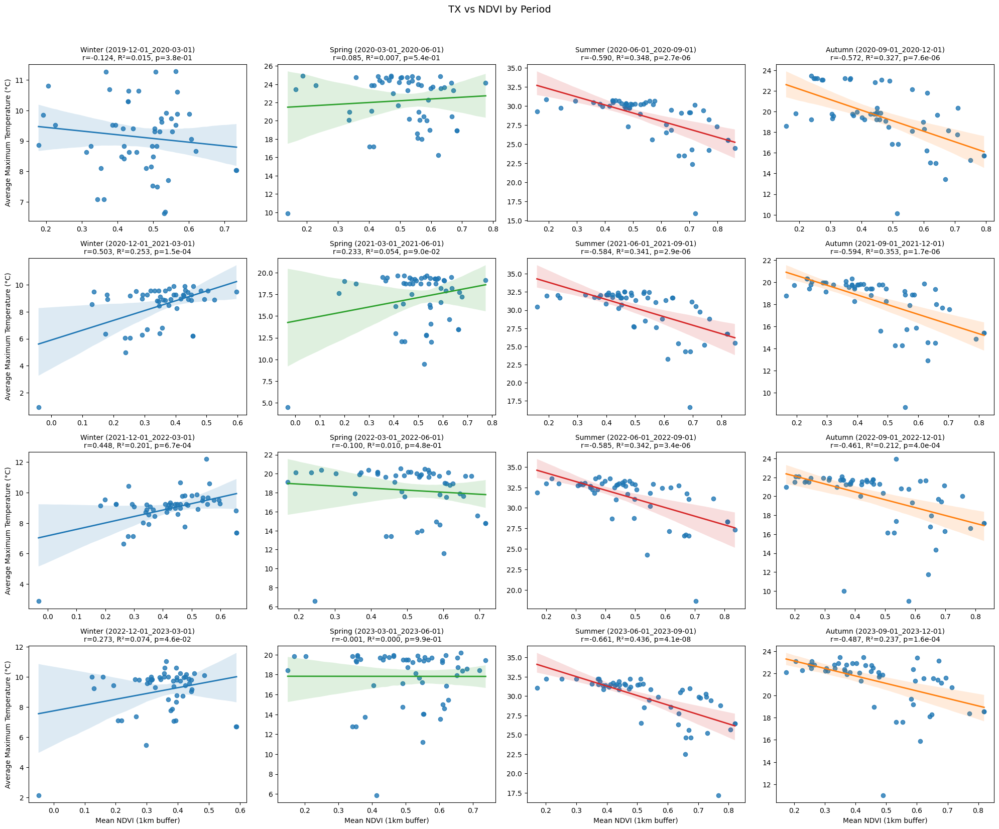

In [43]:
graph_tx_ndvi_correlation(tx_ndvi_df)

For the selected region, we can see a trend in the TX-NDVI correlation across the same season in each year.

In winter, a lower NDVI (less vegetation) corresponds to lower TX values, while in summer, a higher NDVI (more vegetation) corresponds to lower TX values, indicating the cooling effect of vegetation during hotter months.

If we do the same for a different region, we might observe different patterns in the TX-NDVI correlation, reflecting the unique climatic and vegetative characteristics of that area. Let's try with the city of Modena:

### TX-NDVI Correlation Analysis for other cities

TX-NDVI: 100%|██████████████████████| 704/704 [00:34<00:00, 20.58it/s, Period: 2023-09-01_2023-12-01]


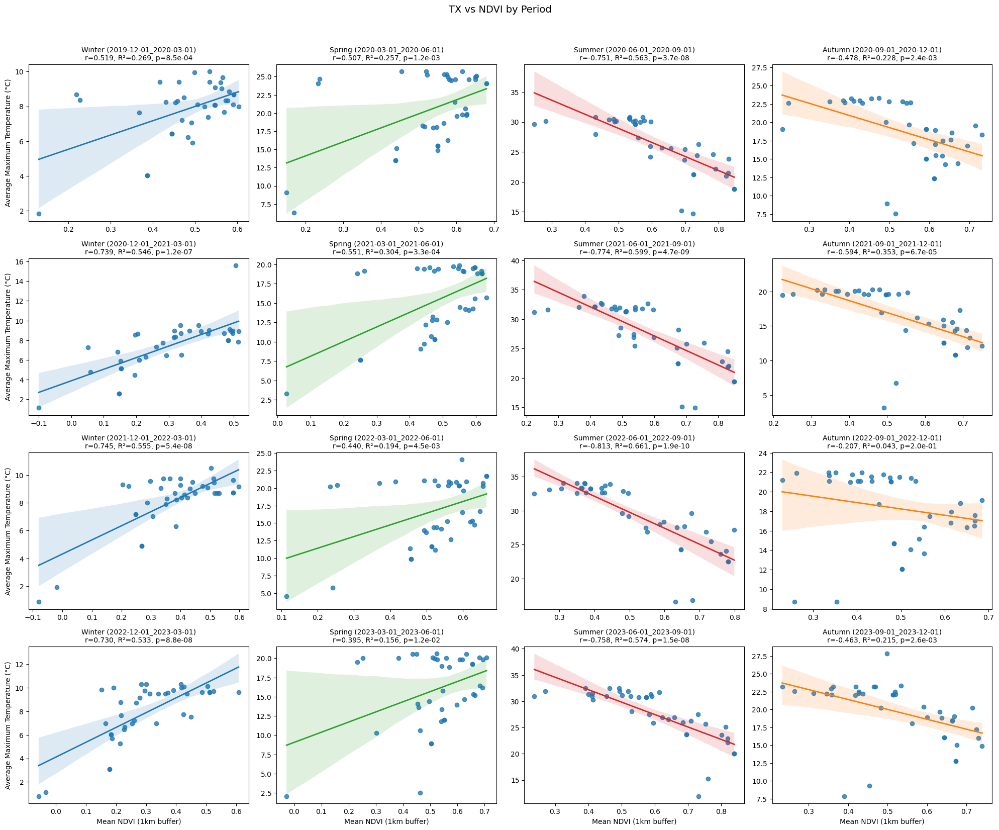

In [44]:
modena_gdf = gadm_gdf[gadm_gdf["NAME_2"] == "Modena"].dissolve()
modena_stations_gdf = stations_gdf[stations_gdf.within(modena_gdf.union_all())]

tx_ndvi_df = prepare_tx_ndvi_corr_df(
    region_gdf=modena_gdf,
    stations_gdf=modena_stations_gdf,
    buffer_meters=1000,
)

graph_tx_ndvi_correlation(tx_ndvi_df)

The region of Modena shows a similar trend to Bologna, with a clear negative correlation between TX and NDVI during the summer months.

TX-NDVI: 100%|██████████████████████| 480/480 [00:27<00:00, 17.16it/s, Period: 2023-09-01_2023-12-01]


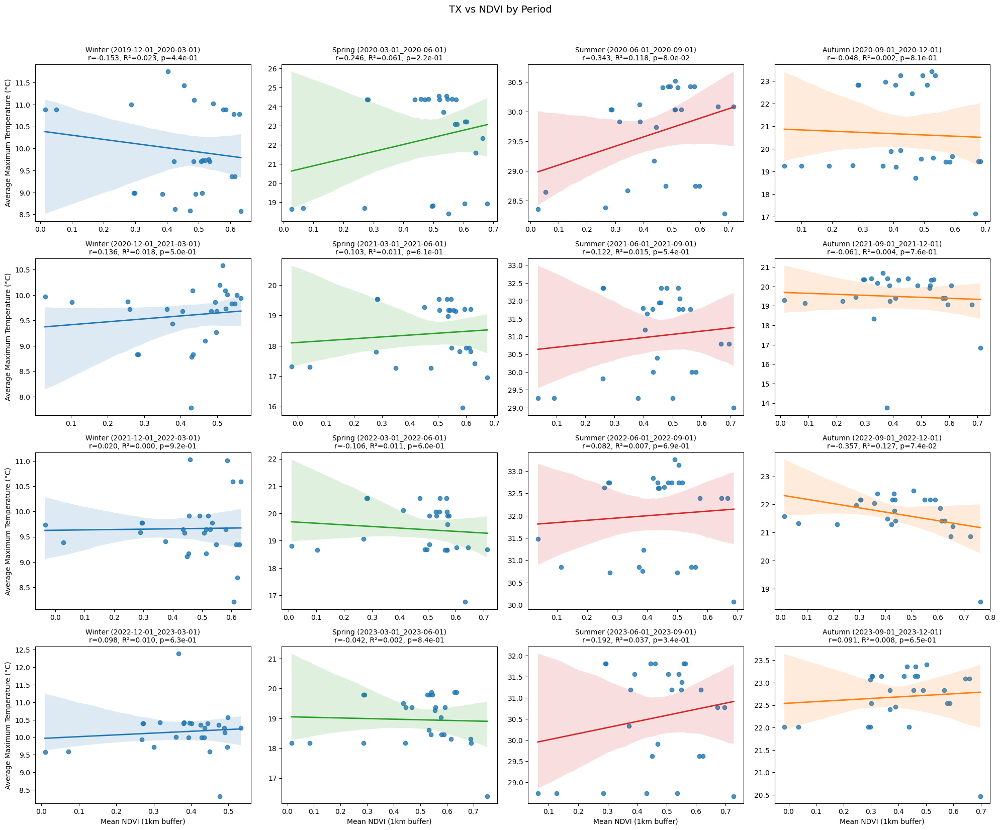

In [45]:
ravenna_gdf = gadm_gdf[gadm_gdf["NAME_2"] == "Ravenna"].dissolve()
ravenna_stations_gdf = stations_gdf[stations_gdf.within(ravenna_gdf.union_all())]

tx_ndvi_df = prepare_tx_ndvi_corr_df(
    region_gdf=ravenna_gdf,
    stations_gdf=ravenna_stations_gdf,
    buffer_meters=1000,
)

graph_tx_ndvi_correlation(tx_ndvi_df)

For the city of Ravenna, the TX-NDVI correlation analysis reveals a less pronounced relationship compared to Bologna and Modena.

This analysis is reasonable given Ravenna being a **coastal city**, where maritime influences can moderate temperature variations and potentially diminish the impact of vegetation on local temperatures.
